In [1]:
%load_ext autoreload
%autoreload 2

%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import setigen as stg
from astropy import units as u
import blimpy as bl
from astropy.time import Time
import extract_signals as es
from context import *

bshuf filter already loaded, skip it.


In [2]:
%matplotlib inline
import matplotlib.pyplot as plt

In [3]:
META

,lookalike,node,direction,indexes,f_start,f_stop
0,blc1,blc03,1,"[2,4,7,9,15]",982.002,982.003
1,dr_-0.03_freq_933.342681,blc02,-1,"[2,3,4,7,8,9,10,11,12,13,14,15,16]",933.34275,933.34375
2,dr_-0.04_freq_1200.011914,blc04,-1,"[1,2,3,4,5,7,8,9,11,12,13,14,15,16]",1200.012485,1200.013285
3,dr_-0.04_freq_1312.585393,blc05,-1,"[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]",1312.585857,1312.586557
4,dr_-0.04_freq_1333.346684,blc05,-1,"[2,3,4,5,7,8,9,10,11,12,13,14,15,16]",1333.347155,1333.347855
...,...,...,...,...,...,...
57,dr_0.04_freq_1062.001512,blc03,1,"[2,3,4,7,9,11,12,13]",1062.0023,1062.0033
58,dr_0.04_freq_1298.698922,blc05,1,"[2,3,4,9,15,16]",1298.6996,1298.7006
59,dr_0.04_freq_1466.681405,blc06,-1,"[2,4,7,8,9,11,13,14,15,16]",1466.6817,1466.6827
60,dr_0.05_freq_1250.013833,blc05,1,"[1,2,3,4,5,7,9,11,14,15,16]",1250.0148,1250.0158


In [3]:
file_list = []
height_ratios = []
for i, row in es.DRIFTS.iterrows():
    filename = row['filename']
    full_path = f'{es.DATA_PREFIX}/{filename}'.replace('blcxx', 
                                                       es.META.loc[0]['node'])
    file_list.append(full_path)

    container = bl.Waterfall(full_path, load_data=False).container
    tchans = container.file_shape[0]
    dt = container.header['tsamp']
    height_ratios.append(tchans * dt)

In [4]:
height_ratios

[301.989888,
 301.989888,
 1795.162112,
 301.989888,
 1795.162112,
 301.989888,
 301.989888,
 1795.162112,
 301.989888,
 1795.162112,
 301.989888,
 1795.162112,
 301.989888,
 1795.162112,
 301.989888,
 1795.162112,
 251.65823999999998]

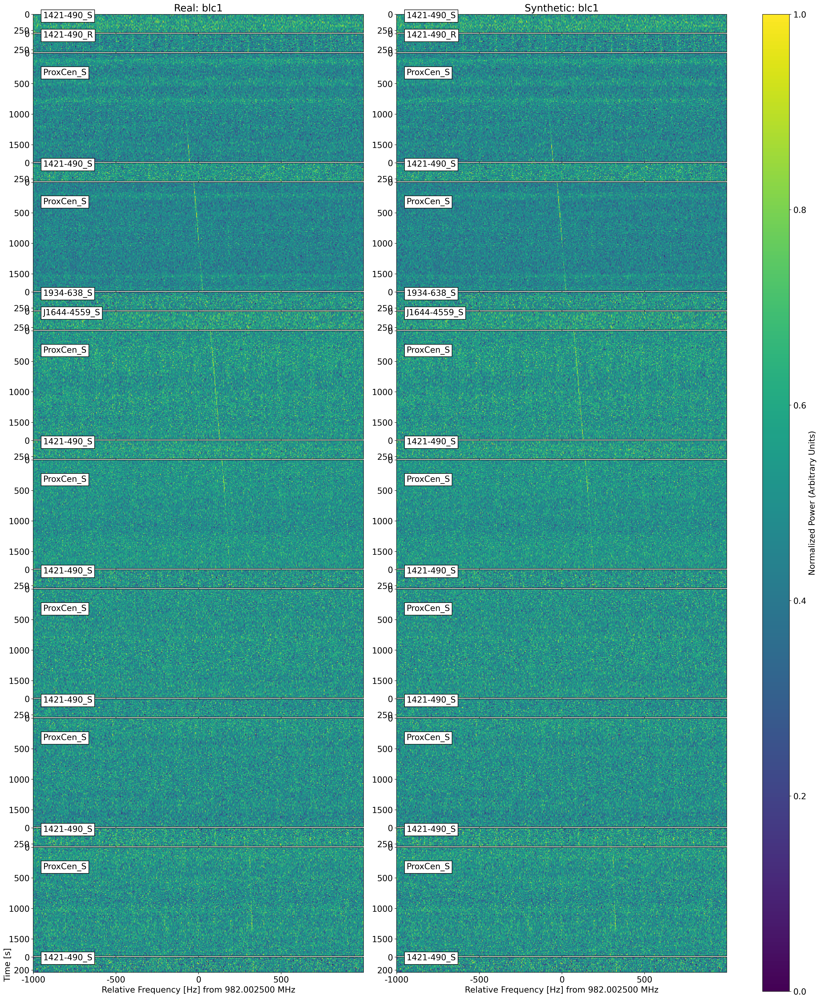

In [23]:
def plot_sequences(candidate=0, f_start=982.0015, f_stop=982.0035):
    file_list = []
    height_ratios = []
    for i, row in es.DRIFTS.iterrows():
        filename = row['filename']
        full_path = f'{es.DATA_PREFIX}/{filename}'.replace('blcxx', 
                                                           es.META.loc[candidate]['node'])
        file_list.append(full_path)

        container = bl.Waterfall(full_path, load_data=False).container
        tchans = container.file_shape[0]
        dt = container.header['tsamp']
        height_ratios.append(tchans * dt)
        
    F_min, F_max = bl.stax.sort2(f_start, f_stop)

    # Compute the midpoint frequency for the x-axis.
    F_mid = np.abs(F_min + F_max) / 2

    n_plots = len(file_list)
    fig_array, axs = plt.subplots(nrows=n_plots,
                                  ncols=2,
                             sharex=True,
                             sharey=False, 
                             dpi=200,
                             figsize=(24, 2*n_plots),
                             gridspec_kw={"height_ratios" : height_ratios})
    
    for ii, filename in enumerate(file_list):
        plt.sca(axs[ii, 0])
        if ii == 0:
            plt.title(f"Real: {es.META.loc[candidate]['lookalike']}")
            
        wf = bl.Waterfall(filename, f_start=F_min, f_stop=F_max)
        last_plot = bl.stax.plot_waterfall(wf)

    # More overall plot formatting, axis labelling.
    factor = 1e6
    units = "Hz"
    xloc = np.linspace(F_min, F_max, 5)
    xticks = [round(loc_freq) for loc_freq in (xloc - F_mid) * factor]
    if np.max(xticks) > 1000:
        xticks = [xt / 1000 for xt in xticks]
        units = "kHz"
    plt.xticks(xloc, xticks)
    plt.xlabel("Relative Frequency [%s] from %f MHz" % (units, F_mid))

    # add plot labels
#     plt.xlabel("Frequency [Hz]")
    plt.ylabel("Time [s]")
    
    for ii, filename in enumerate(file_list):
        plt.sca(axs[ii, 1])
        if ii == 0:
            plt.title(f"Synthetic: {es.META.loc[candidate]['lookalike']}")
            
        wf = bl.Waterfall(filename, f_start=F_min, f_stop=F_max)
        last_plot = bl.stax.plot_waterfall(wf)
    plt.xlabel("Relative Frequency [%s] from %f MHz" % (units, F_mid))
    
    # Adjust plots
    plt.subplots_adjust(hspace=0.02, wspace=0.1)    
        
    # Add colorbar.
    cax = fig_array.add_axes([0.94, 0.11, 0.03, 0.77])
    fig_array.colorbar(last_plot, cax=cax, label="Normalized Power (Arbitrary Units)")

    
plot_sequences(candidate=0, f_start=982.0015, f_stop=982.0035)
plt.show()

In [6]:
filename = es.DRIFTS.loc[0]['filename']
full_path = f'{es.DATA_PREFIX}/{filename}'.replace('blcxx', 
                                                   es.META.loc[0]['node'])

container = bl.Waterfall(full_path, load_data=False).container
tchans = container.file_shape[0]
df = container.header['foff']
dt = container.header['tsamp']
df, dt

(3.814697265625e-06, 16.777216)

In [7]:
all_y = np.load('intensity_data.npy', allow_pickle=True)
ts_info = np.load('ts_info.npy', allow_pickle=True).item()

candidate = all_y[0]['signal']

synth_file_list = []
for i, ts in enumerate(ts_info['ts_list']):
    ys = candidate[i]['scaled_ys']
    noise_mean = candidate[i]['noise_mean']
    print()
    
    frame = stg.Frame(fchans=2000,
                      tchans=len(ts),
                      df=df*u.MHz,
                      dt=dt,
                      fch1=982.0015*u.MHz,
                      ascending=True)
    if noise_mean is None:
        filename = es.DRIFTS['filename'].loc[i]
        full_path = f'{es.DATA_PREFIX}/{filename}'.replace('blcxx', 
                                                           es.META.loc[0]['node'])
        fr = stg.Frame(bl.Waterfall(full_path, f_start=982.0015, f_stop=982.0035))
        noise_mean = fr.noise_mean
    frame.add_noise(noise_mean)
    
    if ys is not None:
        # Make sure values are nonnegative
        frame.add_signal(stg.constant_path(f_start=candidate[i]['center_freq']*u.MHz,
                                            drift_rate=candidate[i]['drift_rate']),
                         frame.noise_std * np.maximum(ys, 0) / 2,
                         stg.sinc2_f_profile(width=6),
                         stg.constant_bp_profile(level=1))
    fn = f'data/synth_blc1_{i}.fil'
    frame.save_fil(fn)
    synth_file_list.append(fn)


blimpy.waterfall INFO     __write_to_fil_light: Writing the spectra matrix for data/synth_blc1_0.fil in one go.
blimpy.waterfall INFO     Conversion time: 0.01sec

blimpy.waterfall INFO     __write_to_fil_light: Writing the spectra matrix for data/synth_blc1_1.fil in one go.
blimpy.waterfall INFO     Conversion time: 0.00sec

blimpy.waterfall INFO     __write_to_fil_light: Writing the spectra matrix for data/synth_blc1_2.fil in one go.
blimpy.waterfall INFO     Conversion time: 0.01sec

blimpy.waterfall INFO     __write_to_fil_light: Writing the spectra matrix for data/synth_blc1_3.fil in one go.
blimpy.waterfall INFO     Conversion time: 0.00sec

blimpy.waterfall INFO     __write_to_fil_light: Writing the spectra matrix for data/synth_blc1_4.fil in one go.
blimpy.waterfall INFO     Conversion time: 0.01sec

blimpy.waterfall INFO     __write_to_fil_light: Writing the spectra matrix for data/synth_blc1_5.fil in one go.
blimpy.waterfall INFO     Conversion time: 0.00sec

blimpy.waterfal

982.0015 982.0035
blimpy.waterfall INFO     __write_to_fil_light: Writing the spectra matrix for data/synth_blc1_0.fil in one go.
blimpy.waterfall INFO     Conversion time: 0.00sec
blimpy.waterfall INFO     __write_to_fil_light: Writing the spectra matrix for data/synth_blc1_1.fil in one go.
blimpy.waterfall INFO     Conversion time: 0.00sec
blimpy.waterfall INFO     __write_to_fil_light: Writing the spectra matrix for data/synth_blc1_2.fil in one go.
blimpy.waterfall INFO     Conversion time: 0.01sec
blimpy.waterfall INFO     __write_to_fil_light: Writing the spectra matrix for data/synth_blc1_3.fil in one go.
blimpy.waterfall INFO     Conversion time: 0.00sec
blimpy.waterfall INFO     __write_to_fil_light: Writing the spectra matrix for data/synth_blc1_4.fil in one go.
blimpy.waterfall INFO     Conversion time: 0.00sec
blimpy.waterfall INFO     __write_to_fil_light: Writing the spectra matrix for data/synth_blc1_5.fil in one go.
blimpy.waterfall INFO     Conversion time: 0.00sec
blim

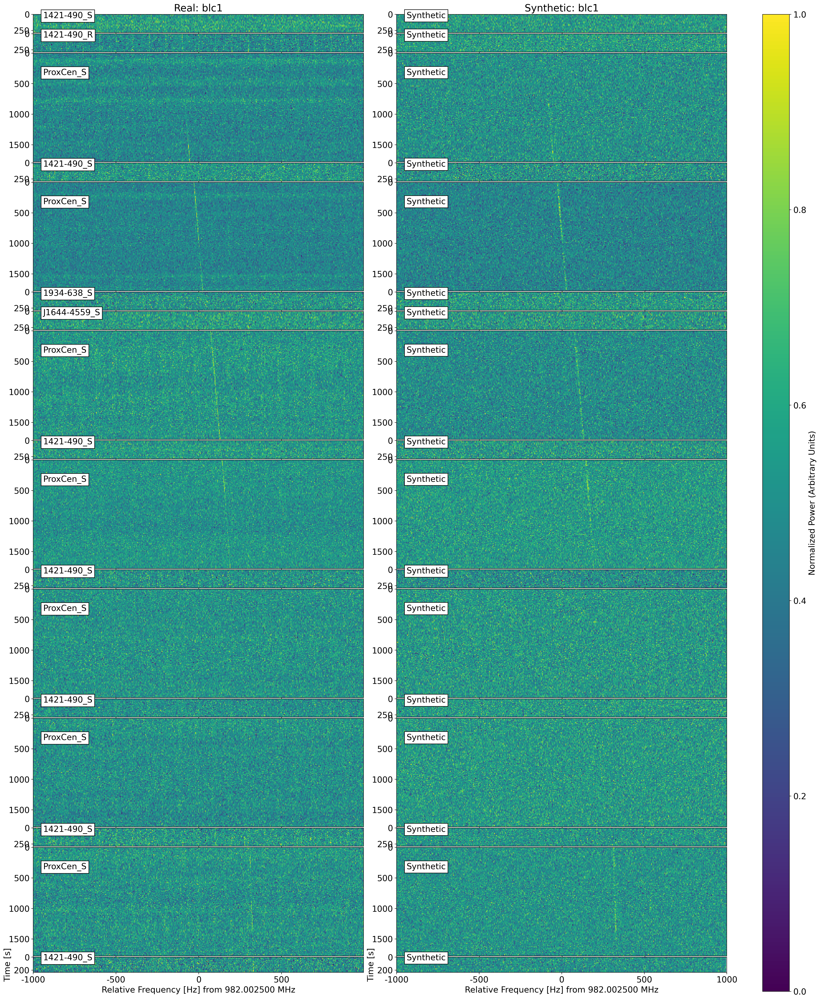

In [30]:
def plot_sequences(candidate=0, f_start=982.0015, f_stop=982.0035):
    # Collect real files
    file_list = []
    height_ratios = []
    for i, row in es.DRIFTS.iterrows():
        filename = row['filename']
        full_path = f'{es.DATA_PREFIX}/{filename}'.replace('blcxx', 
                                                           es.META.loc[candidate]['node'])
        file_list.append(full_path)

        container = bl.Waterfall(full_path, load_data=False).container
        tchans = container.file_shape[0]
        df = abs(container.header['foff']) * 1e6
        dt = container.header['tsamp']
        height_ratios.append(tchans * dt)
        
    F_min, F_max = bl.stax.sort2(f_start, f_stop)

    # Compute the midpoint frequency for the x-axis.
    F_mid = np.abs(F_min + F_max) / 2
    
    # Create plot grid
    n_plots = len(file_list)
    fig_array, axs = plt.subplots(nrows=n_plots,
                                  ncols=2,
                             sharex=True,
                             sharey=False, 
                             dpi=200,
                             figsize=(24, 2*n_plots),
                             gridspec_kw={"height_ratios" : height_ratios})
    
    # Plot real observations
    for ii, filename in enumerate(file_list):
        plt.sca(axs[ii, 0])
        if ii == 0:
            plt.title(f"Real: {es.META.loc[candidate]['lookalike']}")
            
        wf = bl.Waterfall(filename, f_start=F_min, f_stop=F_max)
        last_plot = bl.stax.plot_waterfall(wf)

    # More overall plot formatting, axis labeling.
    factor = 1e6
    units = "Hz"
    xloc = np.linspace(F_min, F_max, 5)
    xticks = [round(loc_freq) for loc_freq in (xloc - F_mid) * factor]
    if np.max(xticks) > 1000:
        xticks = [xt / 1000 for xt in xticks]
        units = "kHz"
    plt.xticks(xloc, xticks)
    plt.xlabel("Relative Frequency [%s] from %f MHz" % (units, F_mid))
    plt.ylabel("Time [s]")
    
    
    # Produce and collect synthetic files
    all_y = np.load('intensity_data.npy', allow_pickle=True)
    candidate_data = all_y[candidate]['signal']
    ts_info = np.load('ts_info.npy', allow_pickle=True).item()

    fchans = wf.data.shape[2]
    synthetic_file_list = []
    for i, ts in enumerate(ts_info['ts_list']):
        ys = candidate_data[i]['scaled_ys']
        noise_mean = candidate_data[i]['noise_mean']

        frame = stg.Frame(fchans=fchans,
                          tchans=len(ts),
                          df=df,
                          dt=dt,
                          fch1=F_min*u.MHz,
                          ascending=True)
        
        if noise_mean is None:
            filename = es.DRIFTS['filename'].loc[i]
            full_path = f'{es.DATA_PREFIX}/{filename}'.replace('blcxx', 
                                                               es.META.loc[candidate]['node'])
            fr = stg.Frame(bl.Waterfall(full_path, f_start=F_min, f_stop=F_max))
            noise_mean = fr.noise_mean
        frame.add_noise(noise_mean)

        if ys is not None:
            # Make sure values are nonnegative
            frame.add_signal(stg.constant_path(f_start=candidate_data[i]['center_freq']*u.MHz,
                                                drift_rate=candidate_data[i]['drift_rate']),
                             frame.noise_std * np.maximum(ys, 0) / 2,
                             stg.sinc2_f_profile(width=2*frame.df),
                             stg.constant_bp_profile(level=1))
        fn = f"data/synth_{es.META.loc[candidate]['lookalike']}_{i}.fil"
        frame.save_fil(fn)
        synthetic_file_list.append(fn)
    
    
    # Plot synthetic observations
    for ii, filename in enumerate(synthetic_file_list):
        plt.sca(axs[ii, 1])
        if ii == 0:
            plt.title(f"Synthetic: {es.META.loc[candidate]['lookalike']}")
            
        wf = bl.Waterfall(filename, f_start=F_min, f_stop=F_max)
        bl.stax.plot_waterfall(wf)
    plt.xticks(xloc, xticks)
    plt.xlabel("Relative Frequency [%s] from %f MHz" % (units, F_mid))
    plt.ylabel("Time [s]")
    
    # Adjust plots
    plt.subplots_adjust(hspace=0.02, wspace=0.1)    
        
    # Add colorbar.
    cax = fig_array.add_axes([0.94, 0.11, 0.03, 0.77])
    fig_array.colorbar(last_plot, cax=cax, label="Normalized Power (Arbitrary Units)")

    
plot_sequences(candidate=0, f_start=982.0015, f_stop=982.0035)
plt.show()

blimpy.waterfall INFO     __write_to_fil_light: Writing the spectra matrix for data/synth_blc1_0.fil in one go.
blimpy.waterfall INFO     Conversion time: 0.00sec
blimpy.waterfall INFO     __write_to_fil_light: Writing the spectra matrix for data/synth_blc1_1.fil in one go.
blimpy.waterfall INFO     Conversion time: 0.00sec
blimpy.waterfall INFO     __write_to_fil_light: Writing the spectra matrix for data/synth_blc1_2.fil in one go.
blimpy.waterfall INFO     Conversion time: 0.01sec
blimpy.waterfall INFO     __write_to_fil_light: Writing the spectra matrix for data/synth_blc1_3.fil in one go.
blimpy.waterfall INFO     Conversion time: 0.00sec
blimpy.waterfall INFO     __write_to_fil_light: Writing the spectra matrix for data/synth_blc1_4.fil in one go.
blimpy.waterfall INFO     Conversion time: 0.00sec
blimpy.waterfall INFO     __write_to_fil_light: Writing the spectra matrix for data/synth_blc1_5.fil in one go.
blimpy.waterfall INFO     Conversion time: 0.00sec
blimpy.waterfall INFO 

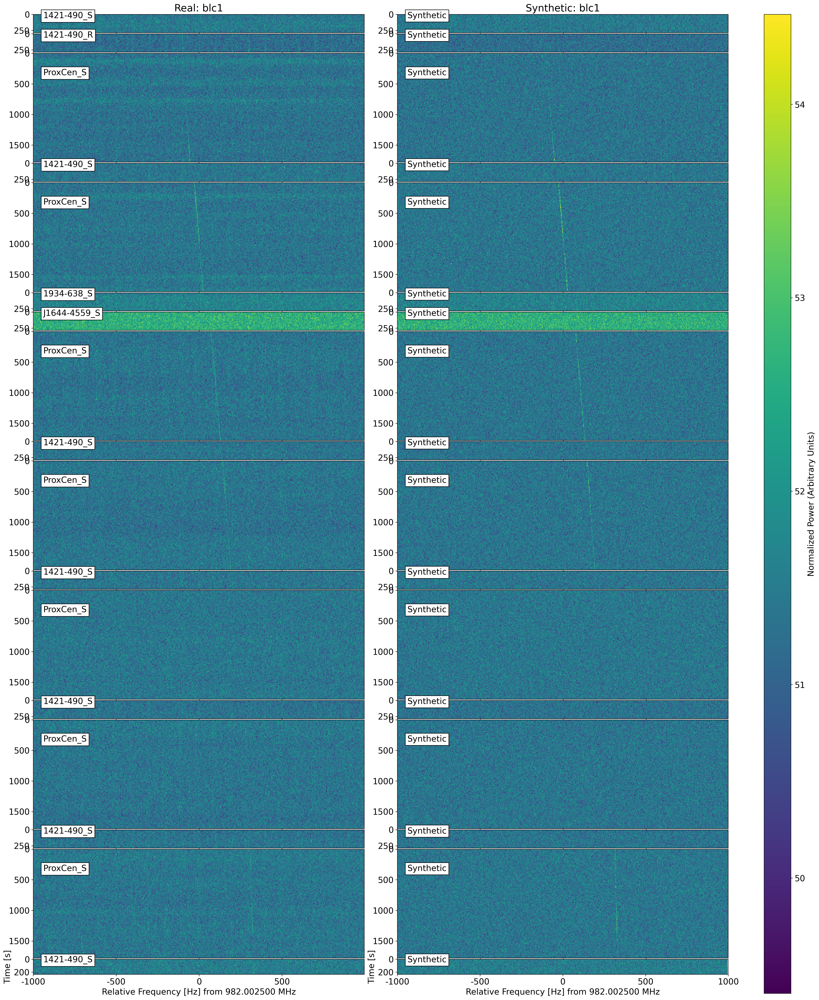

In [25]:
import generate
generate.plot_sequences(candidate=0, f_start=982.0015, f_stop=982.0035)